<a href="https://colab.research.google.com/github/sararayhane/Apple-Lemon-classification/blob/main/Apple_lemon.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split

# path to lemon & apple folders
lemon_path = '/content/drive/MyDrive/datasets/fruit/lemon'
apple_path = '/content/drive/MyDrive/datasets/fruit/apple'

# paths to train & test folders
lemon_train_path = os.path.join(lemon_path, 'train')
lemon_test_path = os.path.join(lemon_path, 'test')
apple_train_path = os.path.join(apple_path, 'train')
apple_test_path = os.path.join(apple_path, 'test')

#function to load images from folder
def load_images_from_folder(folder_path):
    images = []
    for filename in os.listdir(folder_path):
        img_path = os.path.join(folder_path, filename)
        img = cv2.imread(img_path)
        if img is not None:
            images.append(img)
    return images

#split


In [ ]:

# Load images from trainfolders
lemon_train_images = load_images_from_folder(lemon_train_path)
apple_train_images = load_images_from_folder(apple_train_path)

#give labels to train data
lemon_train_labels = np.zeros(len(lemon_train_images))
apple_train_labels = np.ones(len(apple_train_images))

#Combine train images / labelsto 1 array
train_images = np.array(lemon_train_images + apple_train_images)
train_labels = np.concatenate((lemon_train_labels, apple_train_labels))

# Splitt o training and testing
train_images, test_images, train_labels, test_labels = train_test_split(train_images, train_labels, test_size=0.25, random_state=42)


#display lemon

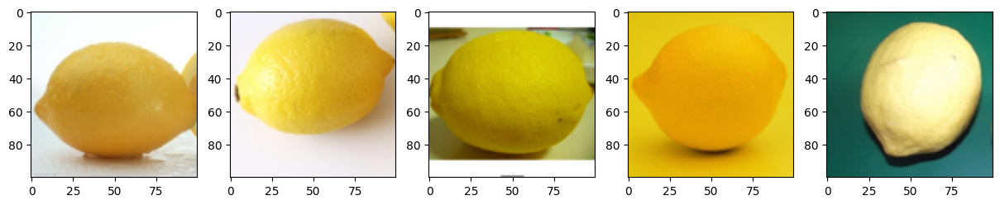

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

lemon_train_folder = '/content/drive/MyDrive/datasets/fruit/lemon/train'

# Get a list of all the image lemon
image_files = [os.path.join(lemon_train_folder, f) for f in os.listdir(lemon_train_folder) if f.endswith('.png')]

# Select 5 random image
random_images = random.sample(image_files, 5)

# Display the images
fig, axs = plt.subplots(1, 5, figsize=(15, 5))
for i in range(5):
    image = Image.open(random_images[i])
    axs[i].imshow(image)
plt.show()



#display apple

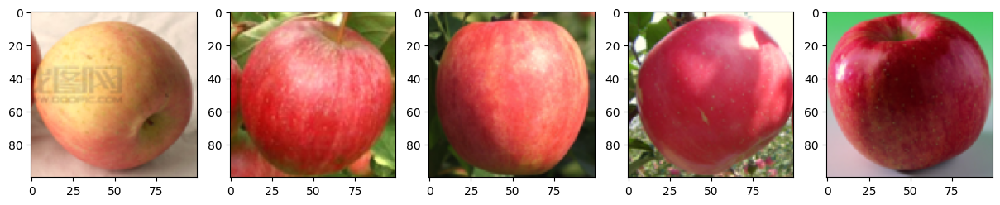

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

lemon_train_folder = '/content/drive/MyDrive/datasets/fruit/apple/train'
image_files = [os.path.join(lemon_train_folder, f) for f in os.listdir(lemon_train_folder) if f.endswith('.png')]
random_images = random.sample(image_files, 5)
fig, axs = plt.subplots(1, 5, figsize=(15, 5))
for i in range(5):
    image = Image.open(random_images[i])
    axs[i].imshow(image)
plt.show()



#color histo

why convertina to hsv: HSV separates the color information from the brightness information in an image so converting an image from the RGB to hsv ykhli l proccess extract the color information from the image more easily...


In [ ]:
def extract_color_histogram(img):
    # Convert the image to the HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    # Set the range for the colors
    #lower_range = np.array([0, 0, 0])
    #upper_range = np.array([255, 255, 255])
    #calculate the color histogram
    hist = cv2.calcHist([hsv], [0, 1, 2], None, [3, 3, 3], [0, 256, 0, 256, 0, 256])
    #Normalize the histogram
    cv2.normalize(hist, hist)
    #return the histogram
    return hist


#display color histogram of images

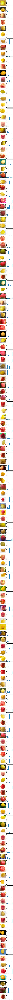

In [ ]:

# Extract color histograms to training images
train_histograms = [extract_color_histogram(img) for img in train_images]

# Display the images with their color histograms
fig, axs = plt.subplots(nrows=len(train_images), ncols=2, figsize=(6,len(train_images)*3))
for i, (img, hist) in enumerate(zip(train_images, train_histograms)):
    axs[i,0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[i,0].axis('off')
    axs[i,1].bar(range(len(hist.flatten())), hist.flatten())
plt.show()

In [ ]:
(train_images[0].shape)

(100, 100, 3)

In [ ]:
len(train_labels)

157

#predicting using KNN

In [ ]:
#function to extract color histograms from an image
def extract_color_histogram(image):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist([hsv_image], [0, 1, 2], None, [8, 8, 8], [0, 180, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

#color histograms from the training images
train_histograms = [extract_color_histogram(img) for img in train_images]
#flatten the histograms
train_histograms = np.array(train_histograms)

#train the KNN model on the training data
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(train_histograms, train_labels)

#color histograms from the test images
test_histograms = [extract_color_histogram(img) for img in test_images]

#flatten the histograms
test_histograms = np.array(test_histograms)
# Predict test labels using thei trained model
predicted_labels = knn.predict(test_histograms)

#the accuracy of the model
accuracy = accuracy_score(test_labels, predicted_labels)
print(f"Accuracy: {accuracy}")


Accuracy: 0.9433962264150944


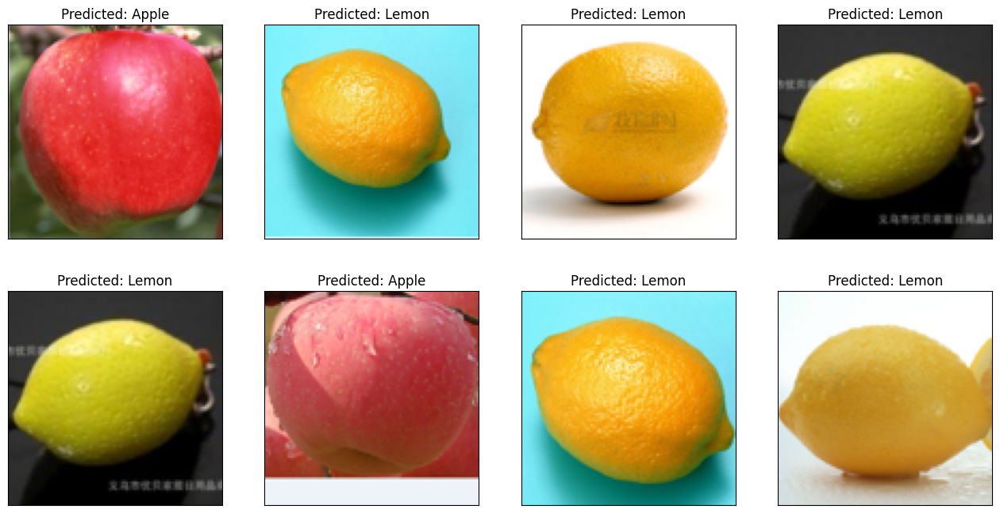

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 4, figsize=(16, 8))
for ax in axs.flatten():
    # Randomly select a test image and its corresponding label
    idx = np.random.randint(len(test_images))
    img = test_images[idx]
    true_label = 'Lemon' if test_labels[idx] == 0 else 'Apple'

    # Extract the color histogram features and predict the label using the KNN model
    histogram = extract_color_histogram(img)
    predicted_label = knn.predict([histogram])[0]

    # Set the title
    ax.set_title('Predicted: {}'.format('Lemon' if predicted_label == 0 else 'Apple'))
    # Display the test image
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

#predicting using SVM

In [ ]:

# Train the SVM model on the training data
svm = SVC(kernel='linear', C=1, random_state=42)
svm.fit(train_histograms, train_labels)

#color histograms from the test images
test_histograms = [extract_color_histogram(img) for img in test_images]

#flatten the histograms
test_histograms = np.array(test_histograms)

#predict the test labels using the trained model
predicted_labels = svm.predict(test_histograms)

#the accuracy of the model
accuracy = accuracy_score(test_labels, predicted_labels)
print(f"Accuracy: {accuracy}")


Accuracy: 0.9622641509433962


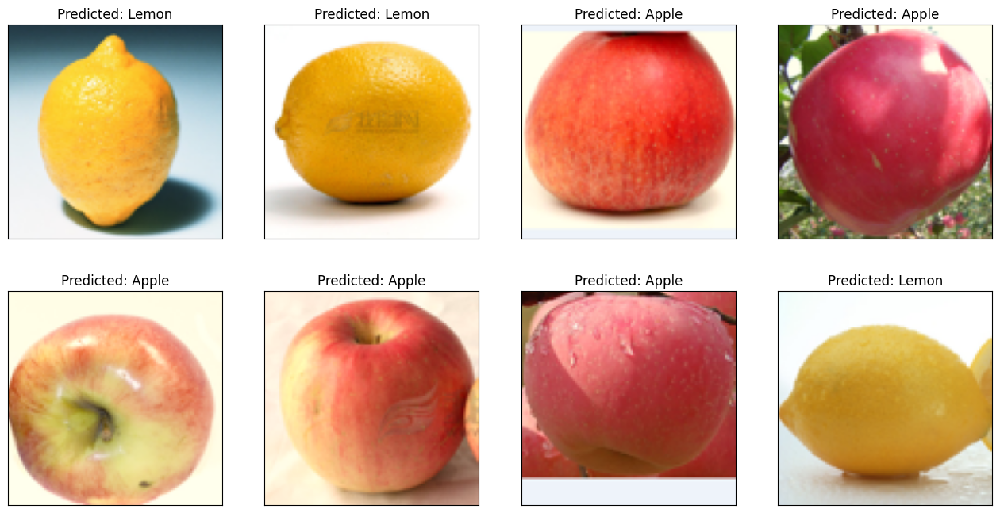

In [ ]:

fig, axs = plt.subplots(2, 4, figsize=(16, 8))
for ax in axs.flatten():
    idx = np.random.randint(len(test_images))
    img = test_images[idx]
    true_label = 'Lemon' if test_labels[idx] == 0 else 'Apple'
    histogram = extract_color_histogram(img)
    predicted_label = svm.predict([histogram])[0]
    ax.set_title('Predicted: {}'.format('Lemon' if predicted_label == 0 else 'Apple')
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()


#confusin matrix

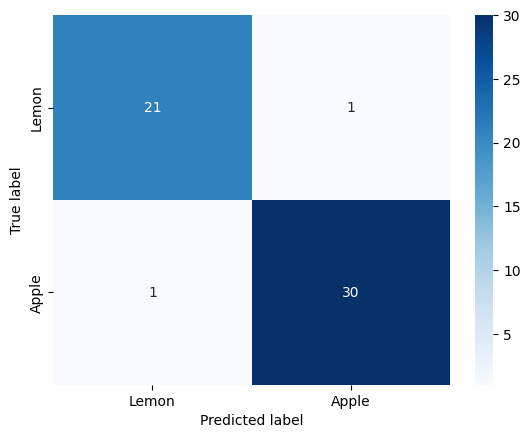

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

#generate the confusion matrix
cm = confusion_matrix(test_labels, predicted_labels)

#heatmap of the confusion matrix
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=['Lemon', 'Apple'], yticklabels=['Lemon', 'Apple'])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()